# Calculate_STD
I can't figure out how to view dask dashboard in python script so here we are

In [1]:
'''
calculate_std.py - calculate the standard deviation for different frequency bands
The goal of this is to get a first order analysis on the acoustic linking at different distances
'''

import xarray as xr
from DAStools import tools
from scipy import signal
import os
from dask.distributed import Client
from tqdm import tqdm
import hvplot.xarray
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd

%load_ext autoreload
%autoreload 2

In [2]:
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 8
Total threads: 32,Total memory: 62.80 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:45573,Workers: 8
Dashboard: http://127.0.0.1:8787/status,Total threads: 32
Started: Just now,Total memory: 62.80 GiB
Comm: tcp://127.0.0.1:44367,Total threads: 4
Dashboard: http://127.0.0.1:33541/status,Memory: 7.85 GiB
Nanny: tcp://127.0.0.1:34727,


### Compute STDs

In [ ]:
wbands = [(0.005, 0.05), (0.05, 0.2), (0.2, 0.5), (0.5,0.9), (0.15, 0.2)]
fband_text = ['p5_5', '5_20', '20_50', '50_90', '15_25']

# open zarr store
storage_options = {'account_name':'dasdata', 'account_key':os.environ['AZURE_KEY_dasdata']}
ds = xr.open_zarr('abfs://zarr/ooi_South_Tx.zarr/ooi_South_Tx.zarr', storage_options=storage_options)

stds = {}

for k, wband in enumerate(tqdm(wbands)):
    b,a = signal.butter(4, wband, btype='bandpass')

    da_filt = tools.filtfilt(ds.RawData, dim='time', b=b, a=a)
    da_filt_std = da_filt.std('time')

    # compute filtered standard deviation for fband
    stds[fband_text[k]] = da_filt_std.compute()

stds_x = xr.Dataset(stds)
stds_x.to_zarr('/datadrive/DAS/stds/fband_stds.zarr', mode='w')

  0%|                                                                                | 0/5 [00:00<?, ?it/s]

### Plot STD

In [2]:
fn = '/datadrive/DAS/stds/fband_stds.zarr'

ds = xr.open_zarr(fn)

In [40]:
plot1 = ds['p5_5'].hvplot.line(grid=True, logy=True, xlabel='distance [m]', ylabel='standard deviation', label='0.5-5 Hz', legend='bottom')
plot2 = ds['5_20'].hvplot.line(grid=True, logy=True, xlabel='distance [m]',  ylabel='standard deviation', label='5-20 Hz')
plot3 = ds['20_50'].hvplot.line(grid=True, logy=True, xlabel='distance [m]',  ylabel='standard deviation', label='20-50 Hz')
plot4 = ds['50_90'].hvplot.line(grid=True, logy=True, xlabel='distance [m]',  ylabel='standard deviation', label='50-90 Hz')

In [41]:
(plot1 * plot2 * plot3 * plot4).opts(title='Standard deviation for different frequencies and channels', width=1000, height=500)

:Overlay
   .Curve.A_0_full_stop_5_hyphen_minus_5_Hz :Curve   [index]   (p5_5)
   .Curve.A_5_hyphen_minus_20_Hz            :Curve   [index]   (5_20)
   .Curve.A_20_hyphen_minus_50_Hz           :Curve   [index]   (20_50)
   .Curve.A_50_hyphen_minus_90_Hz           :Curve   [index]   (50_90)

## Make a spectrogram?

In [3]:
# open zarr store
storage_options = {'account_name':'dasdata', 'account_key':os.environ['AZURE_KEY_dasdata']}
ds = xr.open_zarr('abfs://zarr/ooi_South_Tx.zarr/ooi_South_Tx.zarr', storage_options=storage_options)

In [9]:
# create PSD estimate from chunk
data = ds['RawData'].isel({'distance':20000, 'time':slice(0,3000)}).values

f, Pxx = signal.welch(data, fs=200, nperseg=1024)

In [22]:
spectrogram = tools.spec(ds['RawData'].isel({'distance':20000, 'time':slice(0,10000)}))

Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/home/jhrag/anaconda3/envs/ooi_dev/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3398, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/tmp/ipykernel_3438/3137219572.py", line 1, in <cell line: 1>
    spectrogram = tools.spec(ds['RawData'].isel({'distance':20000, 'time':slice(0,10000)}))
  File "/home/jhrag/Code/DAStools/tools.py", line 69, in spec
    return da.map_blocks(__spec_chunk, template=template)
  File "/home/jhrag/anaconda3/envs/ooi_dev/lib/python3.10/site-packages/xarray/core/dataarray.py", line 4980, in map_blocks
    return map_blocks(func, self, args, kwargs, template)
  File "/home/jhrag/anaconda3/envs/ooi_dev/lib/python3.10/site-packages/xarray/core/parallel.py", line 392, in map_blocks
    raise ValueError(
ValueError: map_blocks requires that one block of the input maps to one block of output. Expected number of output chunks along dimension 'time' to be 4. Received 3 instead.

In [19]:
spectrogram

<xarray.DataArray (time: 13056, frequency: 513)>
dask.array<<this-array>-__spec_chunk, shape=(13056, 513), dtype=float64, chunksize=(1, 513), chunktype=numpy.ndarray>
Dimensions without coordinates: time, frequency

## Plot STD and fill between

In [2]:
fn = '/datadrive/DAS/stds/fband_stds.zarr'
ds = xr.open_zarr(fn)

In [3]:
geo = pd.read_csv('south_DAS_latlondepth.txt')

In [4]:
ds

<xarray.Dataset>
Dimensions:  (distance: 47500)
Dimensions without coordinates: distance
Data variables:
    15_25    (distance) float64 dask.array<chunksize=(23750,), meta=np.ndarray>
    20_50    (distance) float64 dask.array<chunksize=(23750,), meta=np.ndarray>
    50_90    (distance) float64 dask.array<chunksize=(23750,), meta=np.ndarray>
    5_20     (distance) float64 dask.array<chunksize=(23750,), meta=np.ndarray>
    p5_5     (distance) float64 dask.array<chunksize=(23750,), meta=np.ndarray>

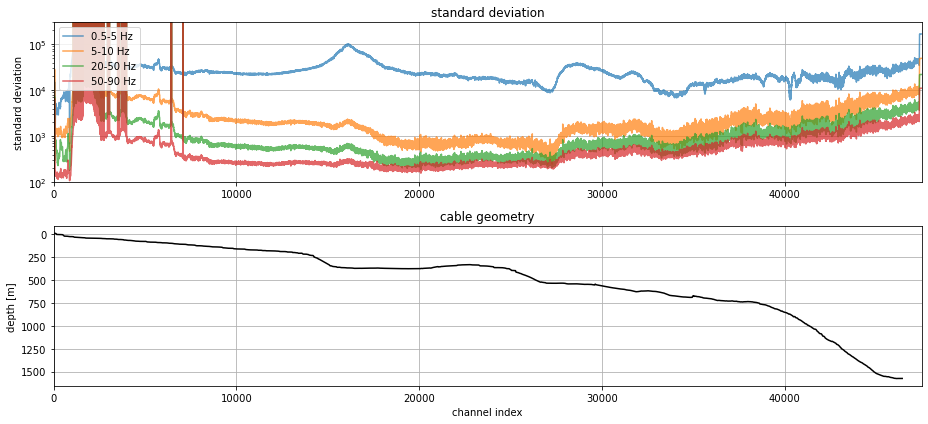

In [10]:
fig, (ax1, ax2) = plt.subplots(2,1, figsize=(13,6))

ax2.set_title('cable geometry')
(-1*geo['depth']).plot(ax=ax2, color='k')
ax2.grid()
ax2.set_xlabel('channel index')
ax2.set_ylabel('depth [m]')
ax2.invert_yaxis()
ax2.set_xlim([0,47500])


ds['p5_5'].plot(ax=ax1, label='0.5-5 Hz', alpha=0.7)
ds['5_20'].plot(ax=ax1, label='5-10 Hz', alpha=0.7)
ds['20_50'].plot(ax=ax1, label='20-50 Hz', alpha=0.7)
ds['50_90'].plot(ax=ax1, label='50-90 Hz', alpha=0.7)
plt.sca(ax1)
plt.yscale('log')
ax1.grid()
ax1.legend(loc='upper left')
ax1.set_xlabel('')
ax1.set_xlim([0,47500])
ax1.set_ylim([1e2, 3e5])
ax1.set_title('standard deviation')
ax1.set_ylabel('standard deviation')

plt.tight_layout()
fig.savefig('figures/std_and_depth.png', dpi=300)